<a href="https://www.kaggle.com/code/eavprog/liner-keras-model-1000-tr25-test5?scriptVersionId=148187252" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Эксперимент от 25.10.2023. 
Модель на 1000 эпох обучения. 
25 изображений на обучениии. 
5 изображений в тесте.

Модель обучили.
Здесь тестируем.

Приложение для преобразования исходных изображений электронного микроскопа в размеченные доступно по адресу https://github.com/prog815/fraktMetal

# Загрузка модели

In [1]:
# Keras for image segmentation model
import tensorflow
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os

model = tensorflow.keras.models.load_model("/kaggle/input/liner-keras-model-1000-tr25-tst5/model_keras.h5")


/opt/conda/lib/python3.10/site-packages/keras/layers/core/lambda_layer.py:325: UserWarning: liner_core.models.identity_feature_extractor is not loaded, but a Lambda layer uses it. It may cause errors.
  function = cls._parse_function_from_config(


# Функция вывода отчета по выборке

In [2]:
def plot_rep(ds_ann_path,ds_imm_path):

    file_names = os.listdir(ds_ann_path)

    fig, ax = plt.subplots(nrows=len(file_names), ncols=3, figsize=(3*6,len(file_names)*6))

    for n in range(len(file_names)):
        img = Image.open(ds_imm_path + '/' + file_names[n]).convert('RGB')
        img = img.resize((256 , 256), Image.LANCZOS)
        ax[n][0].imshow(img)
        ax[n][0].set_title('Исходное изображение '+file_names[n])
        ax[n][0].set_xticks([])
        ax[n][0].set_yticks([])

        img_ann = Image.open(ds_ann_path + '/' + file_names[n]).convert('RGB')
        img_ann = img_ann.resize((256 , 256), Image.LANCZOS)
        ax[n][1].imshow(img_ann)
        ax[n][1].set_title('Размеченное изображение '+file_names[n])
        ax[n][1].set_xticks([])
        ax[n][1].set_yticks([])

        inp_numpy = np.array( img )[None]
        segmentation_output = model.predict( inp_numpy )[0].argmax(-1)

        arr = segmentation_output

        rgb_arr = np.zeros((128, 128, 3), dtype=int)

        dicRGB = {2: (255,0,0), 1: (0,255,0), 0:(0,0,255)}

        for i in range(128):
            for j in range(128):
                rgb_arr[i, j] = dicRGB[arr[i,j]]

                
        mIoU = ((np.array(img_ann.resize((128,128))) == rgb_arr).sum(axis=-1)==3).mean()
        
        ax[n][2].imshow(rgb_arr)
        ax[n][2].set_title('Распознанное изображение (mIoU = ' + str(np.round(mIoU,2)) + ')')
        ax[n][2].set_xticks([])
        ax[n][2].set_yticks([])
    


# Отчет по обучающей выборке

25 изображений участвовавших в обучении модели.

1/1 [==============================] - 0s 106ms/step


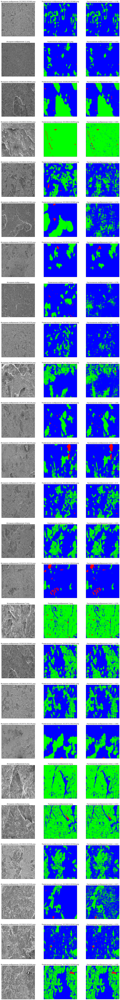

In [3]:
ds_train_ann_path = '/kaggle/input/liner-keras-model-1000-tr25-tst5/Dataset/Annotations'
ds_train_imm_path = '/kaggle/input/liner-keras-model-1000-tr25-tst5/Dataset/Images'

plot_rep(ds_train_ann_path,ds_train_imm_path)

# Отчет по тестовой выборке

5 изображений не участвовавших в обучении модели

1/1 [==============================] - 0s 103ms/step


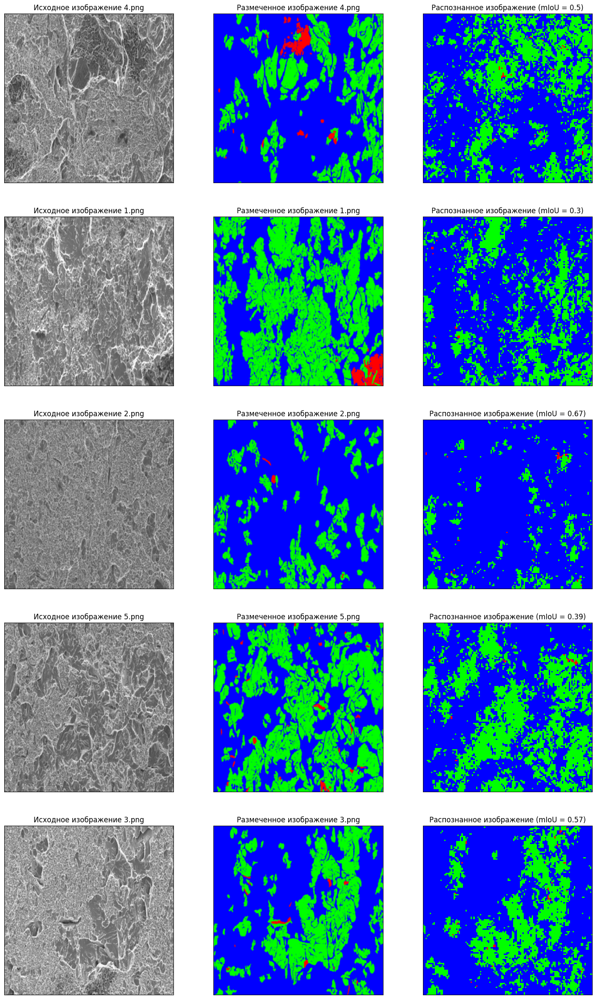

In [4]:
ds_test_ann_path = '/kaggle/input/liner-keras-model-1000-tr25-tst5/test_Dataset/Annotations'
ds_test_imm_path = '/kaggle/input/liner-keras-model-1000-tr25-tst5/test_Dataset/Images'

plot_rep(ds_test_ann_path,ds_test_imm_path)